# **Title: Spectral Processing for Layered Isolation of Tracks**
Names: Titus Lee, Gary Park Matthew Batmunkh

# **Load Original File**

In [ ]:
import numpy as np
import scipy.signal
import librosa
import os
import soundfile as sf
from IPython.display import Audio
import matplotlib.pyplot as plt

!wget https://raw.githubusercontent.com/mbatmu/SPLIT/main/blackbird.wav -O blackbird.wav
!wget https://raw.githubusercontent.com/mbatmu/SPLIT/main/And%20I%20Love%20Her.wav -O AndILoveHer.wav
!wget https://raw.githubusercontent.com/mbatmu/SPLIT/main/mariamaria.wav -O mariamaria.wav
!wget https://raw.githubusercontent.com/mbatmu/SPLIT/main/InMyLife.wav -O InMyLife.wav





--2025-05-17 23:29:54--  https://raw.githubusercontent.com/mbatmu/SPLIT/main/blackbird.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1439632 (1.4M) [audio/wav]
Saving to: ‘blackbird.wav’

blackbird.wav       100%[===================>]   1.37M  --.-KB/s    in 0.07s   

2025-05-17 23:29:55 (20.8 MB/s) - ‘blackbird.wav’ saved [1439632/1439632]

--2025-05-17 23:29:55--  https://raw.githubusercontent.com/mbatmu/SPLIT/main/And%20I%20Love%20Her.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1111538 (1.1M) [audio/wav]
Saving to

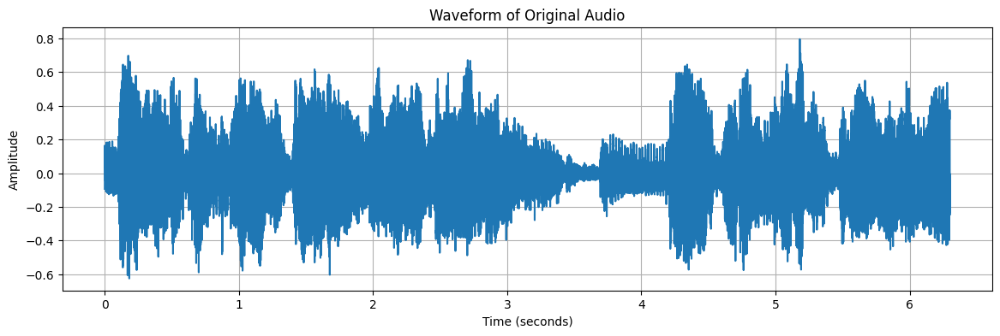

In [ ]:
# --- Load WAV file ---
original_filename = 'AndILoveHer.wav'
y, sr = librosa.load(original_filename, sr=None)  # Load with original sample rate

# --- Plot the waveform ---
plt.figure(figsize=(14, 4))
time = np.linspace(0, len(y) / sr, num=len(y))  # create time axis
plt.plot(time, y)
plt.title("Waveform of Original Audio")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()
display(Audio(data=y, rate=sr))

# **Short-Time Fourier Transform**

In [ ]:
# FT window size (in # of samples)
n_fft = 2048
# how much to slide the FFT window (in # of samples)
hop_length = 256

#computing stft
# f-> array of frequencies (0 Hz, 100Hz, etc.)
# t -> array of time points in which FFT window was taken
# Zxx -> complex matrix containing about amount of f at each t (both magnitude and phase)
f, t, Zxx = scipy.signal.stft(y, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)

# magnitude of each frequency component
magnitude = np.abs(Zxx)
# phase angle of each frequency component (if frequency component is in peak or valley or between)
# necessary for reconstructing stft
phase = np.angle(Zxx)

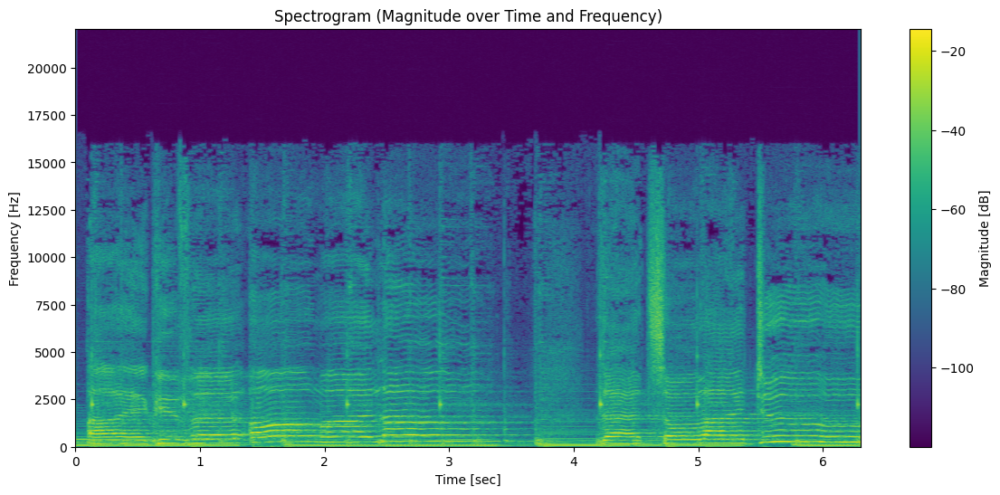

In [ ]:
# Plot the spectrogram (magnitude)
plt.figure(figsize=(14, 6))
plt.pcolormesh(t, f, 20 * np.log10(magnitude + 1e-6), shading='gouraud')
# 20*log10 to convert to dB scale (more natural for hearing)
plt.title('Spectrogram (Magnitude over Time and Frequency)')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar(label='Magnitude [dB]')
plt.show()

#**Spectral Gating**

In [ ]:
# --- Noise Estimation ---
# Assume first 0.5 seconds are noise
num_noise_frames = int((sr * 0.5) / hop_length)
# average magnitude across the first 0.5 seconds
noise_profile = np.mean(magnitude[:, :num_noise_frames], axis=1)

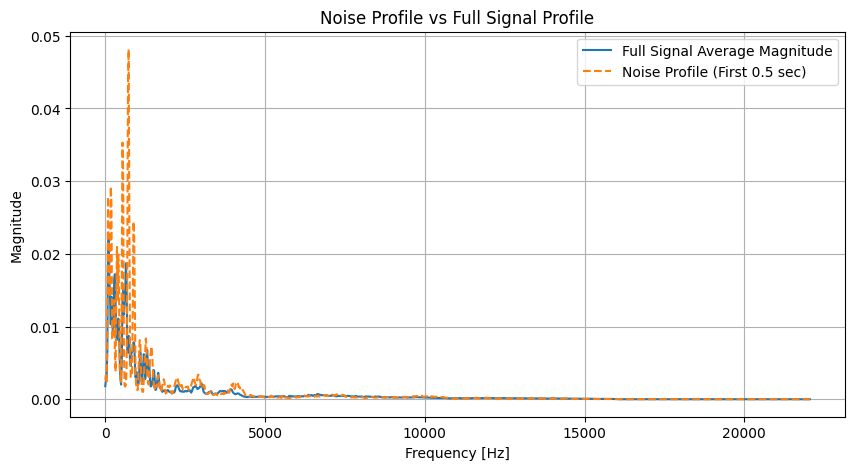

In [ ]:
# plotting the noise estimation
plt.figure(figsize=(10,5))
plt.plot(f, np.mean(magnitude, axis=1), label="Full Signal Average Magnitude")
plt.plot(f, noise_profile, label="Noise Profile (First 0.5 sec)", linestyle='--')
plt.title("Noise Profile vs Full Signal Profile")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Magnitude")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# --- Spectral Gating ---
# set threshold to 2x of the average noise we calculated from above
threshold = noise_profile * 2
# set boolean mask repesenting whether the frequency magnitude is above or below the threshold
mask = magnitude > threshold[:, np.newaxis]
# apply the mask to the original audio by zeroing frequencies that have a magnitude below the threshold
magnitude_clean = magnitude * mask

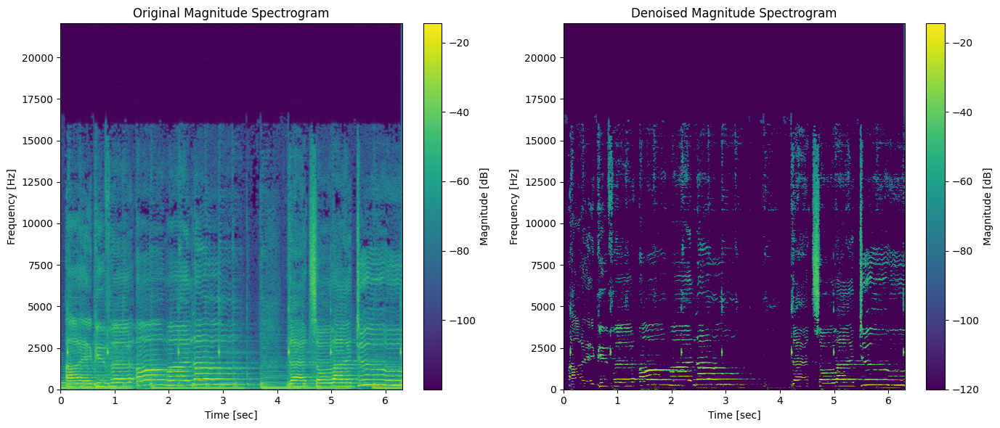

In [ ]:
# plotting original spectogram  vs. denoised spectogram

plt.figure(figsize=(14, 6))

# Original magnitude spectrogram
plt.subplot(1, 2, 1)
# in logarithmic because that's how decibels work
plt.pcolormesh(t, f, 20*np.log10(magnitude + 1e-6), shading='gouraud')
plt.title('Original Magnitude Spectrogram')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar(label='Magnitude [dB]')

# Cleaned magnitude spectrogram
plt.subplot(1, 2, 2)
plt.pcolormesh(t, f, 20*np.log10(magnitude_clean + 1e-6), shading='gouraud')
plt.title('Denoised Magnitude Spectrogram')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar(label='Magnitude [dB]')

plt.tight_layout()
plt.show()

# **Inverse STFT**

In [ ]:
# given the cleaned magnitude spectrum, create cleaned matrix adding phase of each frequency component
Zxx_clean = magnitude_clean * np.exp(1j * phase)
# no need for time value just want the reconstructed time-domain signal
_, y_clean = scipy.signal.istft(Zxx_clean, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
display(Audio(y_clean, rate=sr))

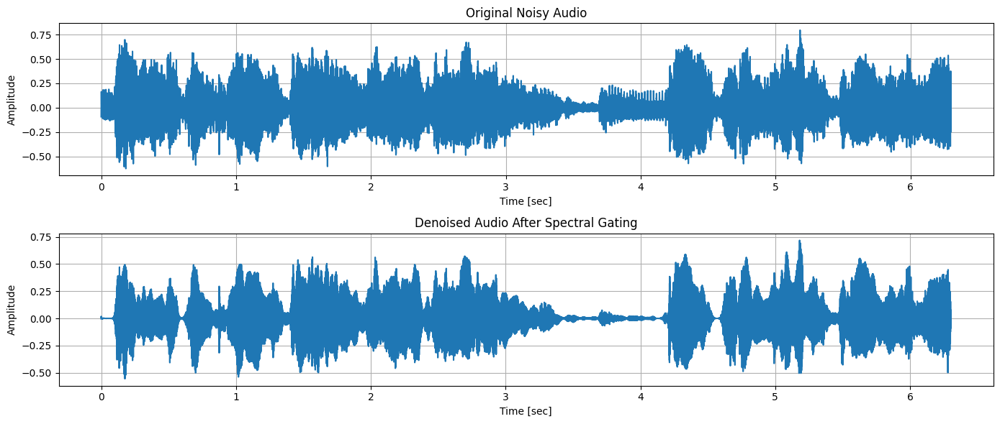

In [ ]:
# plotting original Audio and cleaned Audio
time_original = np.linspace(0, len(y) / sr, num=len(y))
time_clean = np.linspace(0, len(y_clean) / sr, num=len(y_clean))
plt.figure(figsize=(14, 6))
# Plot Original
plt.subplot(2, 1, 1)
plt.plot(time_original, y)
plt.title("Original Noisy Audio")
plt.xlabel("Time [sec]")
plt.ylabel("Amplitude")
plt.grid(True)
# Plot Cleaned
plt.subplot(2, 1, 2)
plt.plot(time_clean, y_clean)
plt.title("Denoised Audio After Spectral Gating")
plt.xlabel("Time [sec]")
plt.ylabel("Amplitude")
plt.grid(True)

plt.tight_layout()
plt.show()

# **Harmonic-Percussive Source Separation (HPSS)**

In [ ]:
# Get STFT again
n_fft = 2048
hop_length = 256
f_clean, t_clean, Zxx_clean = scipy.signal.stft(y_clean, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
magnitude = np.abs(Zxx)
phase = np.angle(Zxx)

In [ ]:
delta = 0  # Adjustable margin threshold (in linear scale, e.g. ~3 dB difference)

harmonic_median = scipy.ndimage.median_filter(magnitude, size=(1, 31))  # time
percussive_median = scipy.ndimage.median_filter(magnitude, size=(31, 1))  # freq

# Create margin-based binary masks
harmonic_mask = (harmonic_median - percussive_median) > delta
percussive_mask = (percussive_median - harmonic_median) > delta

# Optional: handle ambiguous bins — you can zero them out or set to average
ambiguous_mask = ~(harmonic_mask | percussive_mask)
harmonic_mask = harmonic_mask.astype(float)

# Assign 0.5 to ambiguous bins to blend
harmonic_mask += 0.5 * ambiguous_mask

# Apply masks
Zxx_harmonic = Zxx_clean * harmonic_mask

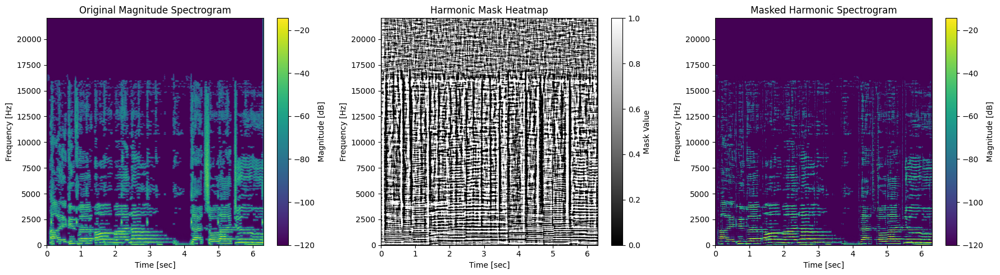

In [ ]:
# plotting
plt.figure(figsize=(18, 5))

# --- Original Spectrogram ---
plt.subplot(1, 3, 1)
plt.pcolormesh(t_clean, f_clean, 20 * np.log10(np.abs(Zxx_clean) + 1e-6), shading='gouraud')
plt.title('Original Magnitude Spectrogram')
plt.xlabel('Time [sec]')
plt.ylabel('Frequency [Hz]')
plt.colorbar(label='Magnitude [dB]')

# --- Harmonic Mask Heatmap ---
plt.subplot(1, 3, 2)
plt.imshow(harmonic_mask, aspect='auto', origin='lower', cmap='gray',
           extent=[t_clean[0], t_clean[-1], f_clean[0], f_clean[-1]])
plt.title('Harmonic Mask Heatmap')
plt.xlabel('Time [sec]')
plt.ylabel('Frequency [Hz]')
plt.colorbar(label='Mask Value')

# --- Harmonic Spectrogram After Masking ---
plt.subplot(1, 3, 3)
plt.pcolormesh(t_clean, f_clean, 20 * np.log10(np.abs(Zxx_harmonic) + 1e-6), shading='gouraud')
plt.title('Masked Harmonic Spectrogram')
plt.xlabel('Time [sec]')
plt.ylabel('Frequency [Hz]')
plt.colorbar(label='Magnitude [dB]')

plt.tight_layout()
plt.show()


In [ ]:
# --- Inverse STFT ---
_, y_final = scipy.signal.istft(Zxx_harmonic, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
display(Audio(y_final, rate=sr))
# --- Save the cleaned audio ---
base_name = os.path.splitext(original_filename)[0]
new_filename = base_name + '-final.wav'
sf.write(new_filename, y_final, sr)

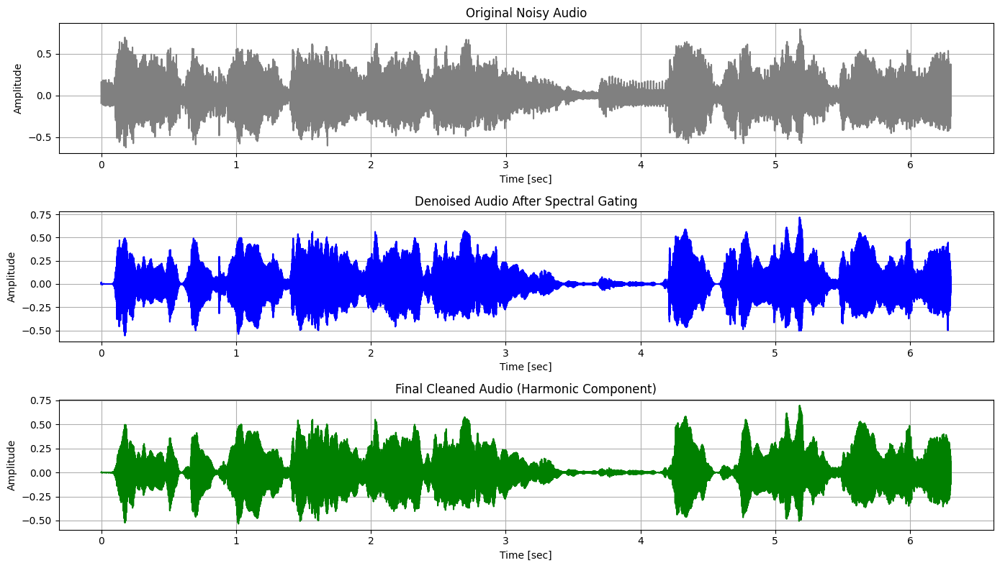

In [ ]:
# Create time axes for all signals
time_original = np.linspace(0, len(y) / sr, num=len(y))
time_clean = np.linspace(0, len(y_clean) / sr, num=len(y_clean))
time_final = np.linspace(0, len(y_final) / sr, num=len(y_final))

# Set up 3-row plot
plt.figure(figsize=(14, 8))

# 1. Original Noisy Audio
plt.subplot(3, 1, 1)
plt.plot(time_original, y, color='gray')
plt.title("Original Noisy Audio")
plt.xlabel("Time [sec]")
plt.ylabel("Amplitude")
plt.grid(True)

# 2. After Spectral Gating
plt.subplot(3, 1, 2)
plt.plot(time_clean, y_clean, color='blue')
plt.title("Denoised Audio After Spectral Gating")
plt.xlabel("Time [sec]")
plt.ylabel("Amplitude")
plt.grid(True)

# 3. Final Audio After HPSS
plt.subplot(3, 1, 3)
plt.plot(time_final, y_final, color='green')
plt.title("Final Cleaned Audio (Harmonic Component)")
plt.xlabel("Time [sec]")
plt.ylabel("Amplitude")
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
def clean_audio(input_filename, n_fft=2048, hop_length=256, noise_duration=0.5, prop_decrease=1.0, hpss_delta=0.0, hpss_blend=0.5):
    # --- Load original audio ---
    y, sr = librosa.load(input_filename, sr=None)
    print("🔊 Original audio:")
    display(Audio(data=y, rate=sr))
    # --- STFT ---
    f, t, Zxx = scipy.signal.stft(y, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
    magnitude = np.abs(Zxx)
    phase = np.angle(Zxx)
    # --- Estimate noise profile ---
    num_noise_frames = int((sr * noise_duration) / hop_length)
    noise_profile = np.mean(magnitude[:, :num_noise_frames], axis=1)
    # --- Spectral gating ---
    threshold = noise_profile * prop_decrease
    mask = magnitude > threshold[:, np.newaxis]
    magnitude_clean = magnitude * mask
    # --- Inverse STFT (after denoising) ---
    Zxx_clean = magnitude_clean * np.exp(1j * phase)
    _, y_clean = scipy.signal.istft(Zxx_clean, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
    y_clean = np.clip(y_clean, -1.0, 1.0)
    print("🎧 After spectral gating (denoising):")
    display(Audio(data=y_clean, rate=sr))
    # --- Apply manual HPSS on cleaned audio ---
    f_clean, t_clean, Zxx_clean = scipy.signal.stft(y_clean, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
    magnitude = np.abs(Zxx_clean)
    phase = np.angle(Zxx_clean)
    harmonic_median = scipy.ndimage.median_filter(magnitude, size=(1, 31))  # over time
    percussive_median = scipy.ndimage.median_filter(magnitude, size=(31, 1))  # over frequency

    harmonic_mask = (harmonic_median - percussive_median) > hpss_delta
    percussive_mask = (percussive_median - harmonic_median) > hpss_delta
    ambiguous_mask = ~(harmonic_mask | percussive_mask)

    harmonic_mask = harmonic_mask.astype(float)
    harmonic_mask += hpss_blend * ambiguous_mask  # blend ambiguous regions

    # --- Apply harmonic mask and inverse STFT ---
    Zxx_harmonic = Zxx_clean * harmonic_mask
    _, y_final = scipy.signal.istft(Zxx_harmonic, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length)
    y_final = np.clip(y_final, -1.0, 1.0)

    print("🎶 Final cleaned (harmonic separated) audio:")
    display(Audio(data=y_final, rate=sr))

    # --- Save final audio ---
    base_name = os.path.splitext(input_filename)[0]
    cleaned_filename = base_name + '-clean.wav'
    sf.write(cleaned_filename, y_final, sr)

    return cleaned_filename


# **Demonstration**

In [ ]:
clean_audio('blackbird.wav', n_fft=2048, hop_length=256, noise_duration=0.5, prop_decrease=4.0, hpss_delta=0.0, hpss_blend=0.1)

🔊 Original audio:


🎧 After spectral gating (denoising):


🎶 Final cleaned (harmonic separated) audio:


'blackbird-clean.wav'

In [ ]:
clean_audio('InMyLife.wav', n_fft=2048, hop_length=256, noise_duration=3.2 , prop_decrease=15, hpss_delta=0.1, hpss_blend=0.1)

🔊 Original audio:


🎧 After spectral gating (denoising):


🎶 Final cleaned (harmonic separated) audio:


'InMyLife-clean.wav'